# Dataset Cars second hand seller. Predicting the price with OLS Regression

# Libraries

In [2]:
#Data Manipulation
import pandas as pd 
import numpy as np 

#Data Vizualisation
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline

#Set a special seaborn style
sns.set_palette("GnBu_d")
sns.set_style('whitegrid')

#Predictive Power Score
import ppscore as pps

#Interactive graphics
import cufflinks as cf 
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Plotly for Notebooks and offline
init_notebook_mode(connected=True)
cf.go_offline()

In [3]:
#Load the dataset
raw_data = pd.read_csv ('1.04. Real-life example.csv')

#Check the head
raw_data.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,320
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,Sprinter 212
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,S 500
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,Q7
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,Rav 4


In [4]:
#Check info
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4345 entries, 0 to 4344
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Brand         4345 non-null   object 
 1   Price         4173 non-null   float64
 2   Body          4345 non-null   object 
 3   Mileage       4345 non-null   int64  
 4   EngineV       4195 non-null   float64
 5   Engine Type   4345 non-null   object 
 6   Registration  4345 non-null   object 
 7   Year          4345 non-null   int64  
 8   Model         4345 non-null   object 
dtypes: float64(2), int64(2), object(5)
memory usage: 305.6+ KB


In [5]:
#Check descriptive statistics, including categorical variables

raw_data.describe(include='all').round(2)

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,Model
count,4345,4173.00,4345,4345.00,4195.00,4345,4345,4345.00,4345
unique,7,NaN,6,NaN,NaN,4,2,NaN,312
top,Volkswagen,NaN,sedan,NaN,NaN,Diesel,yes,NaN,E-Class
freq,936,NaN,1649,NaN,NaN,2019,3947,NaN,199
mean,NaN,19418.75,NaN,161.24,2.79,NaN,NaN,2006.55,NaN
std,NaN,25584.24,NaN,105.71,5.07,NaN,NaN,6.72,NaN
min,NaN,600.00,NaN,0.00,0.60,NaN,NaN,1969.00,NaN
25%,NaN,6999.00,NaN,86.00,1.80,NaN,NaN,2003.00,NaN
50%,NaN,11500.00,NaN,155.00,2.20,NaN,NaN,2008.00,NaN
75%,NaN,21700.00,NaN,230.00,3.00,NaN,NaN,2012.00,NaN


In [6]:
#Remove models
data = raw_data.drop(['Model'],axis=1)

In [7]:
#Check for missing values
data.isnull().sum()

Brand             0
Price           172
Body              0
Mileage           0
EngineV         150
Engine Type       0
Registration      0
Year              0
dtype: int64

In [8]:
#Remove missing values
data_no_mv = data.dropna(axis=0)
data_no_mv.describe(include='all').round(2)

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
count,4025,4025.00,4025,4025.00,4025.00,4025,4025,4025.00
unique,7,NaN,6,NaN,NaN,4,2,NaN
top,Volkswagen,NaN,sedan,NaN,NaN,Diesel,yes,NaN
freq,880,NaN,1534,NaN,NaN,1861,3654,NaN
mean,NaN,19552.31,NaN,163.57,2.76,NaN,NaN,2006.38
std,NaN,25815.73,NaN,103.39,4.94,NaN,NaN,6.70
min,NaN,600.00,NaN,0.00,0.60,NaN,NaN,1969.00
25%,NaN,6999.00,NaN,90.00,1.80,NaN,NaN,2003.00
50%,NaN,11500.00,NaN,158.00,2.20,NaN,NaN,2007.00
75%,NaN,21900.00,NaN,230.00,3.00,NaN,NaN,2012.00


# Probability distribution function, outliers

In [10]:
#Setting a distribution plot to see how the price is spreaded.
data_no_mv['Price'].iplot(kind='histogram',size=10)

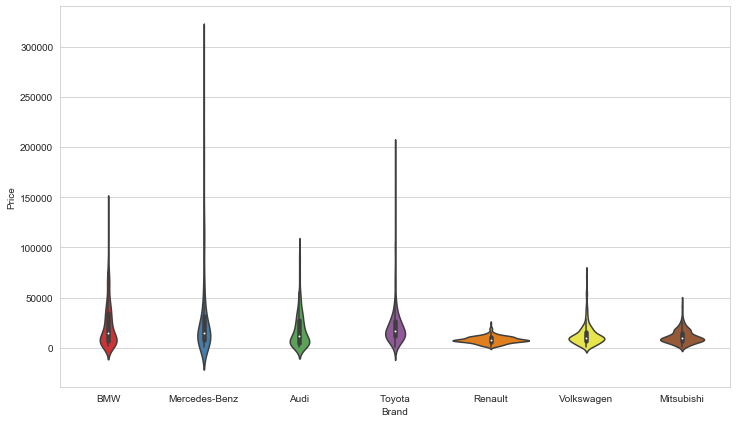

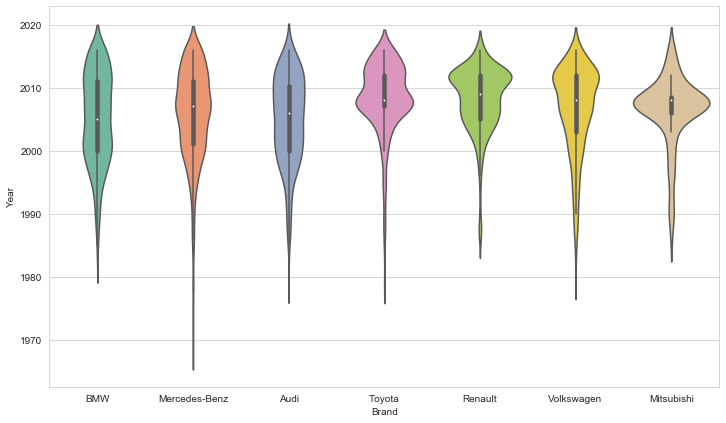

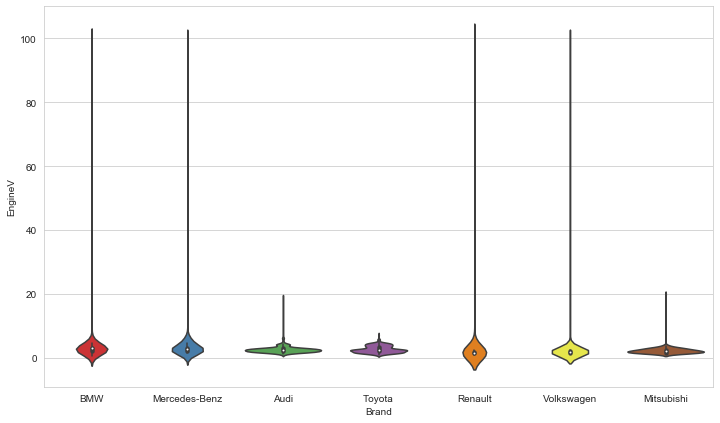

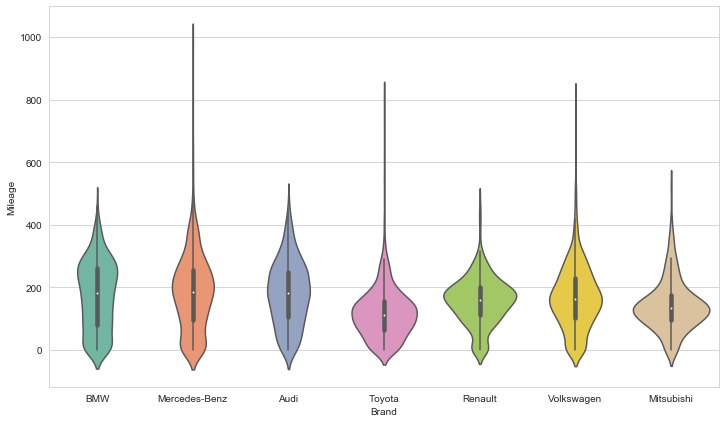

In [11]:
#Exploring the dataset & understanding
#Setting violin plots to check the distribution of some variables per brand.

#For Price
plt.figure(figsize=(12,7))
sns.violinplot(data=data_no_mv,x='Brand',y='Price', palette='Set1')

#For Year
plt.figure(figsize=(12,7))
sns.violinplot(data=data_no_mv,x='Brand',y='Year', palette='Set2')

#For EngineV
plt.figure(figsize=(12,7))
sns.violinplot(data=data_no_mv,x='Brand',y='EngineV', palette='Set1')

#For Mileage
plt.figure(figsize=(12,7))
sns.violinplot(data=data_no_mv,x='Brand',y='Mileage', palette='Set2')

#Apparently huge outliers are present in price (upper side), EngineV (upper side) and some in Mileage (upper side), year (lower side)

## Removing outliers

In [29]:
#Defining a quantile for the price
q = data_no_mv['Price'].quantile(0.99)
#and keep only the value in this quantile.
data_1 = data_no_mv[data_no_mv['Price']<q]

#Same with mileage
q = data_1['Mileage'].quantile(0.99)
data_2 = data_1[data_1['Mileage']<q]

#Year
data_3 = data_2[data_2['Year']>1985]

#And Engine V. Cars with an enginev above 6.5L are very rare.

data_4 = data_3[data_3['EngineV']<6.5]

#Checking again the descriptive statistics. Apparently The difference between Q3 and max in price is still high.
data_4.describe(include='all').round(2)

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
count,3896,3896.00,3896,3896.00,3896.00,3896,3896,3896.00
unique,7,NaN,6,NaN,NaN,4,2,NaN
top,Volkswagen,NaN,sedan,NaN,NaN,Diesel,yes,NaN
freq,856,NaN,1483,NaN,NaN,1812,3534,NaN
mean,NaN,18077.83,NaN,161.15,2.45,NaN,NaN,2006.56
std,NaN,19062.50,NaN,95.88,0.95,NaN,NaN,6.32
min,NaN,800.00,NaN,0.00,0.60,NaN,NaN,1986.00
25%,NaN,7075.00,NaN,92.00,1.80,NaN,NaN,2003.00
50%,NaN,11500.00,NaN,158.00,2.20,NaN,NaN,2008.00
75%,NaN,21500.00,NaN,227.00,3.00,NaN,NaN,2012.00


In [234]:
#We can check how many observations we removed : 3,21%
print (((3896-4025)/4025)*100)

-3.204968944099379


In [144]:
data_4[(data_4['EngineV']<1.2)]

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
117,Renault,11990.00,van,210,1.10,Diesel,yes,2010
188,BMW,38888.00,vagon,5,0.65,Other,yes,2015
250,Volkswagen,8000.00,hatch,41,1.00,Petrol,yes,2012
345,Renault,7600.00,van,108,1.00,Diesel,yes,2013
804,Toyota,11300.00,hatch,87,1.00,Petrol,yes,2009
1923,Toyota,5750.00,hatch,160,1.00,Petrol,yes,2006
1996,Toyota,8500.00,hatch,55,1.00,Petrol,yes,2011
2196,Volkswagen,7000.00,van,350,1.00,Other,yes,2004
2214,Renault,2650.00,vagon,1,1.00,Diesel,no,2006
2432,Toyota,10500.00,hatch,17,1.00,Petrol,yes,2016


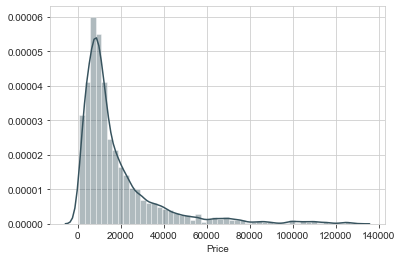

In [160]:
sns.distplot(data_4['Price'])

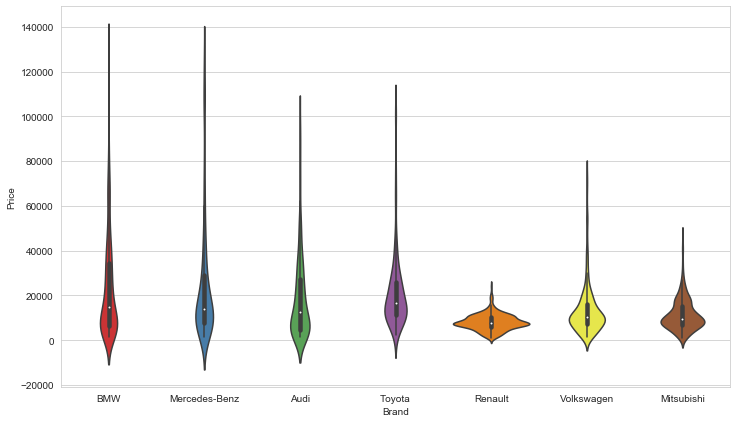

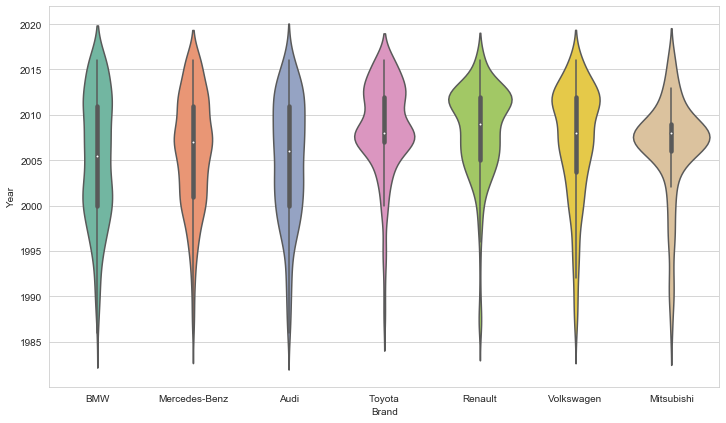

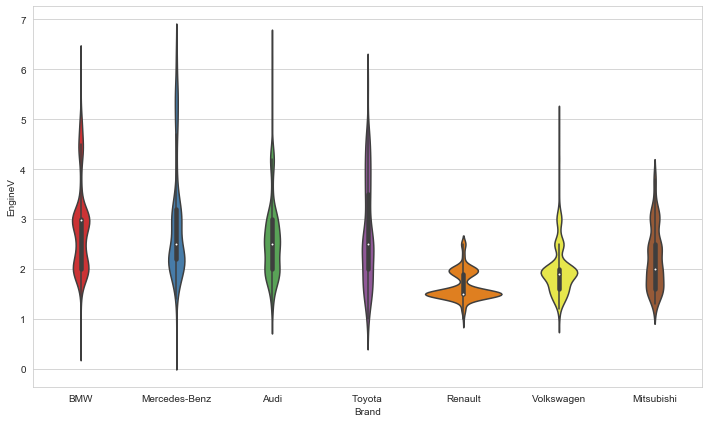

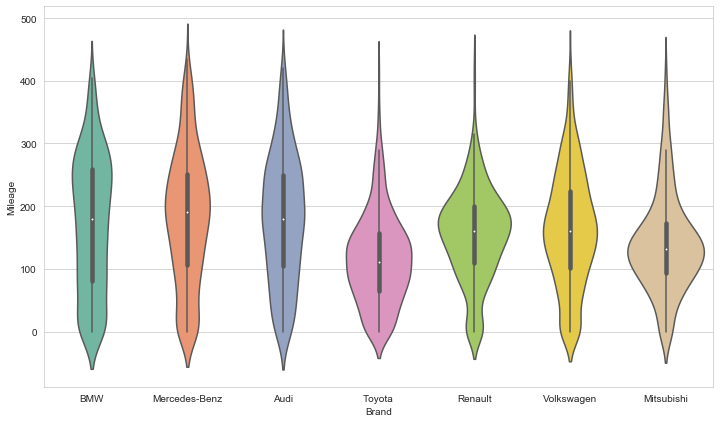

In [31]:
#Re set violin plots to see the evolution

#For Price
plt.figure(figsize=(12,7))
sns.violinplot(data=data_4,x='Brand',y='Price', palette='Set1')

#For Year
plt.figure(figsize=(12,7))
sns.violinplot(data=data_4,x='Brand',y='Year', palette='Set2')

#For EngineV
plt.figure(figsize=(12,7))
sns.violinplot(data=data_4,x='Brand',y='EngineV', palette='Set1')

#For Mileage
plt.figure(figsize=(12,7))
sns.violinplot(data=data_4,x='Brand',y='Mileage', palette='Set2')

#This is much better, even if price and engine V has still some peaks.

## Reset the index

In [32]:
#Reset the index and give a better name to the dataset

data_cleaned = data_4.reset_index(drop=True)

#Checking again statistics
data_cleaned.describe(include='all')

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year
count,3896,3896.000000,3896,3896.000000,3896.000000,3896,3896,3896.000000
unique,7,NaN,6,NaN,NaN,4,2,NaN
top,Volkswagen,NaN,sedan,NaN,NaN,Diesel,yes,NaN
freq,856,NaN,1483,NaN,NaN,1812,3534,NaN
mean,NaN,18077.832574,NaN,161.147331,2.445932,NaN,NaN,2006.560318
std,NaN,19062.501846,NaN,95.878801,0.947649,NaN,NaN,6.321710
min,NaN,800.000000,NaN,0.000000,0.600000,NaN,NaN,1986.000000
25%,NaN,7075.000000,NaN,92.000000,1.800000,NaN,NaN,2003.000000
50%,NaN,11500.000000,NaN,158.000000,2.200000,NaN,NaN,2008.000000
75%,NaN,21500.000000,NaN,227.000000,3.000000,NaN,NaN,2012.000000


# Checking relationships between variables

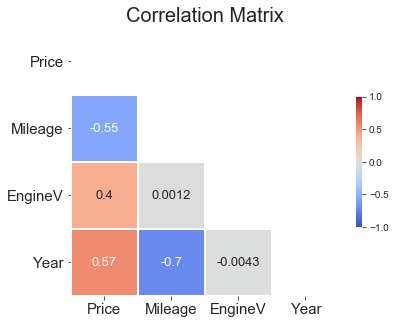

In [36]:
# Setting a correlation matrix to evaluate linear relationships.

#Initializing the correlation matrix
corr_matrix = data_cleaned.corr()

#Setting the mask to keep only the lower side
mask = np.zeros_like(corr_matrix, dtype=np.bool)
mask[np.triu_indices_from(mask)]= True

#Setting a visual representation of the correlation matrix
f, ax = plt.subplots(figsize=(6, 6))

heatmap = sns.heatmap(corr_matrix,
                      mask=mask,
                      square = True,
                      linewidths = .5,
                      cmap = 'coolwarm',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [-1, -.5, 0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {"size": 13})

#add the column names as labels

plt.title('Correlation Matrix',fontsize=20)
ax.set_yticklabels(corr_matrix.columns, rotation = 0,fontsize=15)
ax.set_xticklabels(corr_matrix.columns,fontsize=15)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

## Link to predictive power score
https://towardsdatascience.com/rip-correlation-introducing-the-predictive-power-score-3d90808b9598

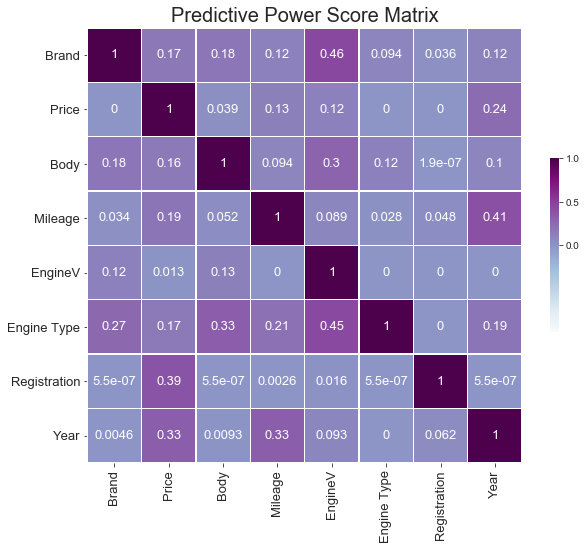

In [42]:
#We can set then a matrix with the predictive power score (See link below)
#PPS is based on decision tree classifiers/regressors and can reveal asymmetrics and non-linear relationships, for both numerical and categorical variables.

#Setting the pps matrix
pps_matrix = pps.matrix(data_cleaned)

#Setting a visual representation of the pps matrix
f, ax = plt.subplots(figsize=(10, 8))

heatmap = sns.heatmap(pps_matrix,
                      square = True,
                      linewidths = .5,
                      cmap = 'BuPu',
                      cbar_kws = {'shrink': .4,
                                'ticks' : [0, 0.5, 1]},
                      vmin = -1,
                      vmax = 1,
                      annot = True,
                      annot_kws = {"size": 13})

#add the column names as labels

plt.title('Predictive Power Score Matrix',fontsize=20)
ax.set_yticklabels(pps_matrix.columns, rotation = 0,fontsize=13)
ax.set_xticklabels(pps_matrix.columns,fontsize=13)

sns.set_style({'xtick.bottom': True}, {'ytick.left': True})

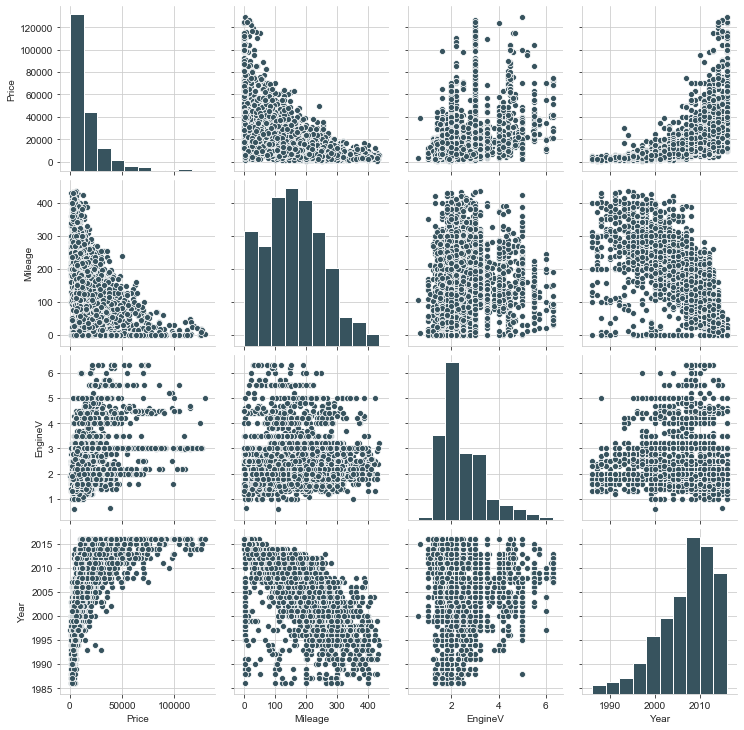

In [50]:
#Setting a pairplot
sns.pairplot(data_cleaned)

# Checking the logarithm of the dependent variable

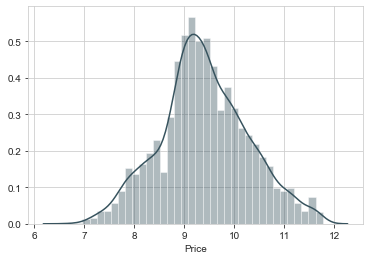

In [52]:
#Checking how the log price is distributed
sns.distplot(np.log(data_cleaned['Price']))

In [54]:
#Adding the log price to the dataset
log_price = np.log(data_cleaned['Price'])
data_cleaned['log_price'] = log_price
data_cleaned.head()

,Brand,Price,Body,Mileage,EngineV,Engine Type,Registration,Year,log_price
0,BMW,4200.0,sedan,277,2.0,Petrol,yes,1991,8.342840
1,Mercedes-Benz,7900.0,van,427,2.9,Diesel,yes,1999,8.974618
2,Mercedes-Benz,13300.0,sedan,358,5.0,Gas,yes,2003,9.495519
3,Audi,23000.0,crossover,240,4.2,Petrol,yes,2007,10.043249
4,Toyota,18300.0,crossover,120,2.0,Petrol,yes,2011,9.814656


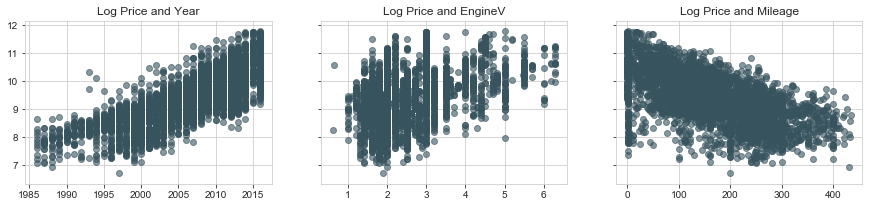

In [66]:
#Checking relationships with the log_price

f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize =(15,3))

ax1.scatter(data_cleaned['Year'],data_cleaned['log_price'],alpha=0.6)
ax1.set_title('Log Price and Year')
ax2.scatter(data_cleaned['EngineV'],data_cleaned['log_price'],alpha=0.6)
ax2.set_title('Log Price and EngineV')
ax3.scatter(data_cleaned['Mileage'],data_cleaned['log_price'],alpha=0.6)
ax3.set_title('Log Price and Mileage')


plt.show()

In [205]:
#Checking the variance of the features

data_cleaned[['Mileage','EngineV','Year']].apply(np.var, axis=0)

Mileage   9190.38
EngineV      0.90
Year        39.95
dtype: float64

# Variance Inflation Factor

In [62]:
#Checking multicollinearity

from statsmodels.stats.outliers_influence import variance_inflation_factor

variables = data_cleaned[['Mileage', 'Year', 'EngineV']]
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(variables.values,i) for i in range (variables.shape[1])]
vif["features"] = variables.columns

vif

,VIF,features
0,3.797414,Mileage
1,10.400359,Year
2,7.662861,EngineV


In [68]:
#Removing Year column

data_no_multicollinearity = data_cleaned.drop(['Year'],axis=1)
data_no_multicollinearity = data_cleaned.drop(['Price'],axis=1)

# Get Dummies

In [71]:
#Get dummies and drop first to avoid multicollinearity

data_with_dummies = pd.get_dummies(data_no_multicollinearity, drop_first=True)
data_preprocessed = data_with_dummies
data_preprocessed.head()

,Mileage,EngineV,Year,log_price,Brand_BMW,Brand_Mercedes-Benz,Brand_Mitsubishi,Brand_Renault,Brand_Toyota,Brand_Volkswagen,Body_hatch,Body_other,Body_sedan,Body_vagon,Body_van,Engine Type_Gas,Engine Type_Other,Engine Type_Petrol,Registration_yes
0,277,2.0,1991,8.342840,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1
1,427,2.9,1999,8.974618,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1
2,358,5.0,2003,9.495519,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1
3,240,4.2,2007,10.043249,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
4,120,2.0,2011,9.814656,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1


# Variables definition, scaling and train-test split

## Inputs & Targets

In [72]:
#Define targets and inputs

targets = data_preprocessed['log_price']
inputs = data_preprocessed.drop(['log_price'],axis=1)

## Scaling inputs & Train test split

In [74]:
#Standardization

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(inputs)

inputs_scaled = scaler.transform(inputs)

#Train test split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(inputs_scaled, targets, test_size=0.25, random_state=42)

# OLS Multiple Linear Regression : Training

## Training the model

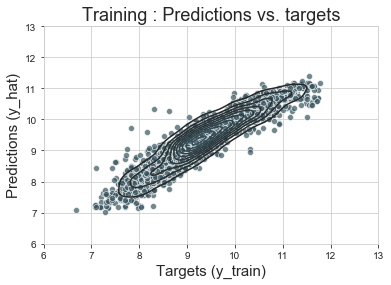

In [216]:
#Import the model from Sklearn
from sklearn.linear_model import LinearRegression

#Fit the model
reg = LinearRegression()
reg.fit(X_train,y_train)

#Evaluating the performance
y_hat = reg.predict(x_train)

sns.scatterplot(y_train, y_hat,alpha=0.7)
sns.kdeplot(y_train,y_hat)
plt.title('Training : Predictions vs. targets',size=18)
plt.xlabel('Targets (y_train)',size=15)
plt.ylabel('Predictions (y_hat)',size=15)
plt.xlim(6,13)
plt.ylim(6,13)
plt.show()

## Setting R2 and intercept

In [259]:
# If we want to find the Adjusted R-squared we can do so by knowing the r2, the # observations, the # features
r2 = reg.score(x_train,y_train)
# Number of observations is the shape along axis 0
n = X_train.shape[0]
# Number of features (predictors, p) is the shape along axis 1
p = X_train.shape[1]
# We find the Adjusted R-squared using the formula
adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
adjusted_r2

#Priting R Squared, Adjusted R Squared and Intercept/Bias
reg_scores = pd.DataFrame({'Metric':['R Squared','Adjusted R Squared','Bias'],'Value':[reg.score(x_train,y_train),adjusted_r2,reg.intercept_]})
pd.set_option('display.float_format', lambda x: '%.4f' % x)
reg_scores

,Metric,Value
0,R Squared,0.8829
1,Adjusted R Squared,0.8822
2,Bias,9.4006


## Get coefficients

In [95]:
#Printing coefficients / weights

reg_summary = pd.DataFrame(inputs.columns.values, columns=['Features'])
reg_summary['Weights'] = reg.coef_
reg_summary

,Features,Weights
0,Mileage,-0.116653
1,EngineV,0.213697
2,Year,0.511723
3,Brand_BMW,0.021623
4,Brand_Mercedes-Benz,-0.002771
5,Brand_Mitsubishi,-0.135607
6,Brand_Renault,-0.205185
7,Brand_Toyota,-0.080233
8,Brand_Volkswagen,-0.105526
9,Body_hatch,-0.093070


# OLS Multiple Linear Regression : Testing

## Testing the model

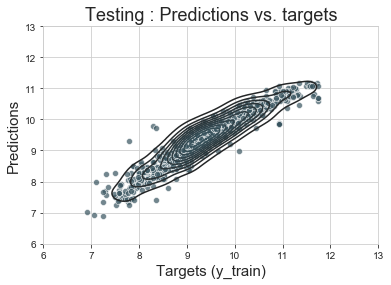

Text(0.5, 1.0, 'Residuals Distribution')

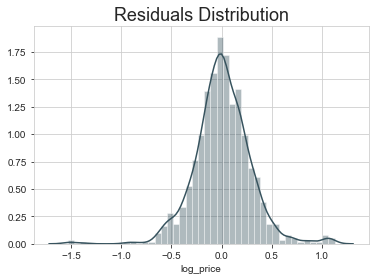

In [129]:
#Testing
predictions = reg.predict(x_test)

sns.scatterplot(y_test, predictions,alpha=0.7)
sns.kdeplot(y_test, predictions)
plt.title('Testing : Predictions vs. targets',size=18)
plt.xlabel('Targets (y_train)',size=15)
plt.ylabel('Predictions',size=15)
plt.xlim(6,13)
plt.ylim(6,13)
plt.show()

#Checking residuals

sns.distplot (y_test - predictions)
plt.title("Residuals Distribution", size=18)

## Statistics of the predictions

### Mean error metrics 

In [226]:
#Checking Mean Errors

from sklearn import metrics

pd.set_option('display.float_format', lambda x: '%.4f' % x)

mean_error = pd.DataFrame({'Metric':['Mean Absolute Error (MAE)','Mean Squared Error (MSE)','Root Mean Squared Error (RMSE)'],'Value':[metrics.mean_absolute_error(y_test, predictions).round(4),metrics.mean_squared_error(y_test, predictions).round(4),np.sqrt(metrics.mean_squared_error(y_test, predictions)).round(4)]})

mean_error

,Metric,Value
0,Mean Absolute Error - MAE,0.2057
1,Mean Squared Error - MSE,0.0801
2,Root Mean Squared Error - RMSE,0.2831


In [130]:
#checking predictions descricptive stasticics, with np.exp to get the real price

#Create a dataframe and add a column for both pred and targets
df_pf = pd.DataFrame(np.exp(predictions), columns=['Prediction'])
df_pf['Target'] = np.exp(y_test)
y_test = y_test.reset_index(drop=True)

#Add a column with the residuals
df_pf['Residual'] = df_pf['Target'] - df_pf['Prediction']

#Add a column with the absolute difference in % between prediction and target
df_pf['Difference%'] = np.absolute(df_pf['Residual']/df_pf['Target']*100)

#Round .2 for pd data frames:
#pd.set_option('display.float_format', lambda x: '%.2f' % x)

#Get desc. stats
df_pf.describe().round(2)

,Prediction,Target,Residual,Difference%
count,974.00,974.00,974.00,974.00
mean,16391.41,18227.92,1836.51,21.14
std,13560.43,20099.21,9477.61,25.62
min,993.08,999.00,-14841.62,0.04
25%,6971.35,7025.00,-1553.52,7.01
50%,12442.00,11500.00,35.20,15.59
75%,21059.82,21500.00,1723.97,27.83
max,71829.58,125000.00,84560.65,364.75


## Checking OLS assumptions

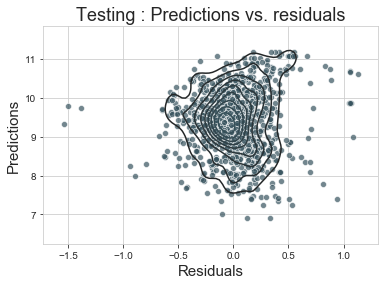



Residuals Mean: 0.01121862097300317


In [219]:
#Defining a variable for the residuals
residuals = y_test - predictions

#Plotting residuals vs predictions.
sns.scatterplot(residuals, predictions,alpha=0.7)
sns.kdeplot(residuals, predictions)
plt.title('Testing : Predictions vs. residuals',size=18)
plt.xlabel('Residuals',size=15)
plt.ylabel('Predictions',size=15)
plt.show()

#Checking if the mean of residuals is close to 0
print ('\n')
print ('Residuals Mean:', residuals.mean())

### Homoscedasticity of residuals

Text(0, 0.5, 'Fitted y -log price-')

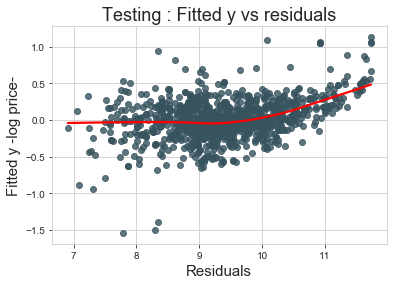

In [180]:
#Plotting residuals vs y_test.

sns.regplot(x=y_test, y=residuals, lowess=True, line_kws={'color': 'red'})
plt.title('Testing : Fitted y vs residuals',size=18)
plt.xlabel('Residuals',size=15)
plt.ylabel('Fitted y -log price-',size=15)

### Autocorrelation of the residuals

(0.5, 42)

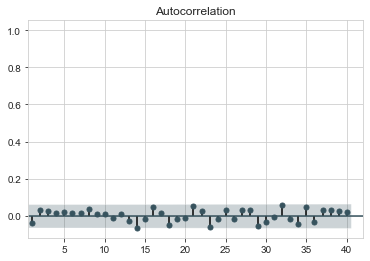

In [200]:
#Checking autocorrelation of the residuals. Residuals should be in the blue area, defined by alpha (level of confidence)

import statsmodels.tsa.api as smt

acf = smt.graphics.plot_acf(residuals, lags=40 , alpha=0.05)
acf.show()
plt.xlim(0.5,42)

In [324]:
df_with_clusters.iplot(x='Year', y='log_price',z='Clusters',kind='surface')

In [325]:
df_comp.iplot(x='First',y='Second',z='Third',kind='surface')

In [326]:
data_preprocessed.iplot(kind='surface',size=10,x='log_price',y='Year',z='Mileage')